# Data Exploration

This notebook explores the data and potential processing options that can help us in the future.

In [1]:
import io
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pathlib
import tifffile

from PIL import Image
from IPython.display import Image as IPImage, display
from matplotlib.animation import FuncAnimation
from skimage.io import imread

# Local import
from piv.points_df import Points

In [2]:
df = Points.from_csv('out/points.csv')
df.head()

,Unnamed: 0,point_id,cell_id,cut,time,x_px,y_px,timestamp,x,y,x_parallel,x_perpendicular,cut_length,vx,vy,velocity,t_rel,v_parallel,v_perpendicular,velocity_cut
0,0,0,220530-E1_Out,False,3,368.0,192.0,2731.228878,18.530605,9.668142,0.781787,1.414699,4.704884,NaN,NaN,NaN,0.000000,NaN,NaN,NaN
1,1,0,220530-E1_Out,False,4,371.0,192.0,2734.003849,18.681669,9.668142,0.784880,1.565061,4.704884,0.054438,0.000000,0.054438,2.774971,0.001115,0.054185,0.054197
2,2,0,220530-E1_Out,False,5,372.0,193.0,2734.999678,18.732024,9.718496,0.775258,1.620032,4.704884,0.050566,0.050566,0.071511,3.770800,-0.009662,0.055201,0.056041
3,3,0,220530-E1_Out,False,6,374.0,194.0,2736.011395,18.832734,9.768851,0.766667,1.725124,4.704884,0.099543,0.049772,0.111293,4.782517,-0.008492,0.103875,0.104221
4,4,0,220530-E1_Out,False,7,375.0,194.0,2737.007224,18.883089,9.768851,0.767698,1.775245,4.704884,0.050566,0.000000,0.050566,5.778346,0.001035,0.050331,0.050341


In [3]:
times = df.get_unique('time')
cells = df.get_unique('cell_id')

In this example notebook, we will explore one particular experiment: `220530-E1_Out`.

In [ ]:
experiment = '220530-E1_Out'

In [5]:
# Reading in the image from the associated experiment

image_dir = 'data/tiff'
image_files = [f for f in os.listdir(image_dir) if experiment in f and f.endswith('.tiff')] # type: ignore
if len(image_files) > 1:
    raise ValueError(f'Expected only one image for experiment {experiment}, but found {len(image_files)}')

image = tifffile.TiffFile(f'{image_dir}/{image_files[0]}')
image_data = np.squeeze(image.asarray())

In [6]:
# Preparation for visual plotting
channel_red     = image_data[0] # shape -> (115, 512, 512)
channel_green   = image_data[1] # shape -> (115, 512, 512)

# Normalize for visualization 
channel_red_norm    = channel_red / channel_red.max()
channel_green_norm  = channel_green / channel_green.max()

# Create RG(B) stack for each slice
rgb_stack = np.zeros((115, 512, 512, 1), dtype=np.float32)
rgb_stack[..., 0] = channel_red_norm
#rgb_stack[..., 1] = channel_green_norm

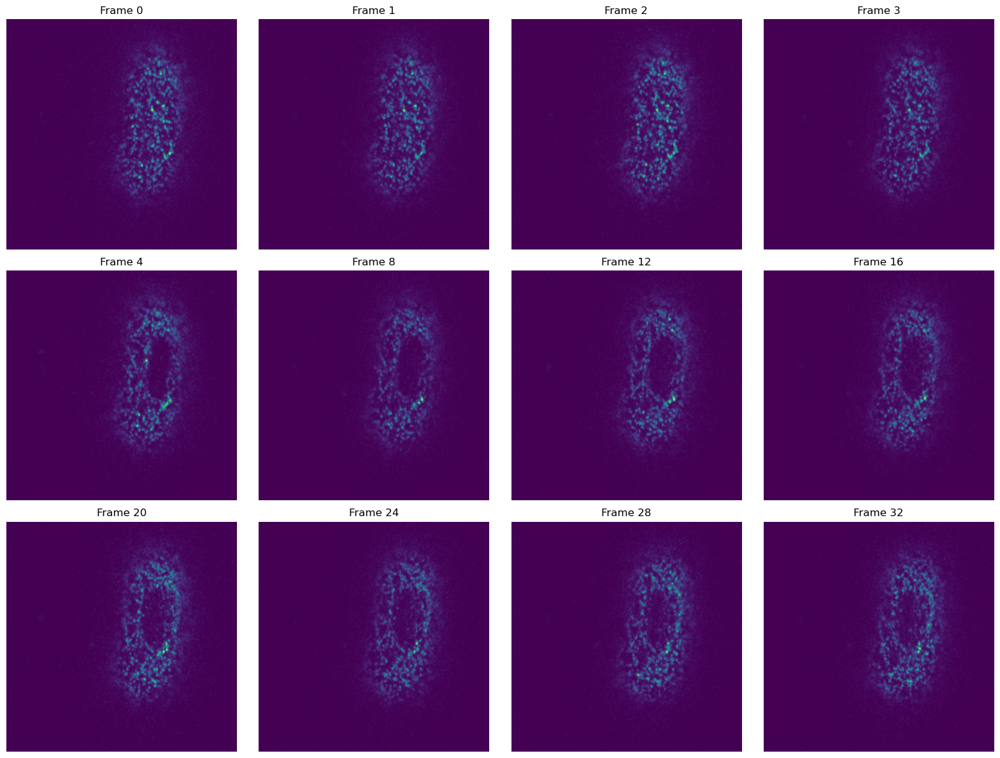

In [7]:
def visualize_frames_grid(rgb_stack: np.ndarray, frames: list[int]):
    n_frames = len(frames)
    cols = 4
    rows = (n_frames + cols - 1) // cols  # ceiling division

    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(rows, cols)

    for i, frame_idx in enumerate(frames):
        r, c = divmod(i, cols)
        axes[r, c].imshow(rgb_stack[frame_idx])
        axes[r, c].set_title(f"Frame {frame_idx}")
        axes[r, c].axis('off')

    # Hide any unused subplots
    for j in range(i + 1, rows * cols):
        r, c = divmod(j, cols)
        axes[r, c].axis('off')

    plt.tight_layout()
    plt.show()

visualize_frames_grid(rgb_stack, [0, 1, 2, 3, 4, 8, 12, 16, 20, 24, 28, 32])

(115, 512, 512)


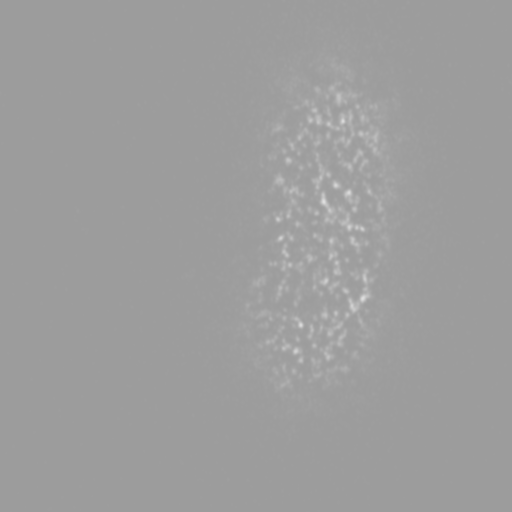

In [8]:
def to_gif(rgb_stack):
    print(rgb_stack.shape)
    # Normalize floats to 0–255 if needed
    if np.issubdtype(rgb_stack.dtype, np.floating):
        rgb_stack = np.clip(rgb_stack, 0, 1)
        rgb_stack = (rgb_stack * 255).astype(np.uint8)
    elif rgb_stack.dtype != np.uint8:
        rgb_stack = rgb_stack.astype(np.uint8)

    pil_frames = [Image.fromarray(frame) for frame in rgb_stack]

    # Save to in-memory buffer as gif
    buf = io.BytesIO()
    pil_frames[0].save(
        buf,
        format='GIF',
        save_all=True,
        append_images=pil_frames[1:],
        duration=100,  # milliseconds per frame
        loop=0
    )
    buf.seek(0)

    return buf

# Display GIF inline
buffer = to_gif(rgb_stack.squeeze())
display(IPImage(data=buffer.getvalue()))

## PIV Baseline


This part implements the basic tutorial outlined on the [OpenPIV](https://openpiv.readthedocs.io/en/latest/src/piv_basics.html) documentation.

In [ ]:
def visualize(data: np.ndarray, title: str = ''):
    fig, ax = plt.subplots(1, 1, figsize=(6,6))

    ax.imshow(data, cmap='viridis')
    ax.set_title(title)

    plt.tight_layout()
    plt.show()

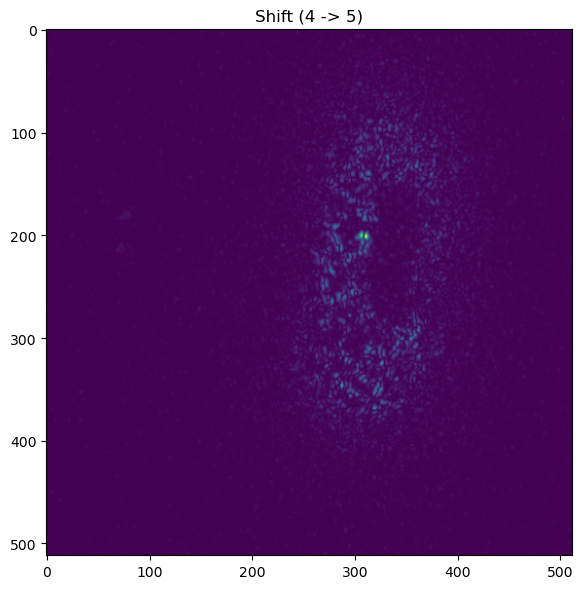

In [10]:
frame_index_a = 4
frame_index_b = 5

frame_a = rgb_stack[frame_index_a]
frame_b = rgb_stack[frame_index_b]
shift = np.abs(frame_a - frame_b)

visualize(shift, f'Shift ({frame_index_a} -> {frame_index_b})')

### Finding shift using least-squares template matching

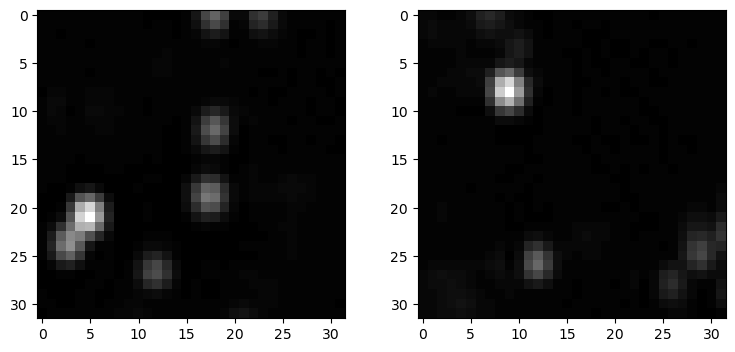

In [11]:
# Define a window
win_size = 32

a_win = frame_a[:win_size, :win_size].copy()
b_win = frame_b[:win_size, :win_size].copy()

fig, axs = plt.subplots(1, 2, figsize=(9, 4))
axs[0].imshow(a_win, cmap=plt.cm.gray)
axs[1].imshow(b_win, cmap=plt.cm.gray)
plt.show()

In [ ]:
def match_template(image, template, max_roll: int = 8):
    best_dist = np.inf
    best_shift = (-1, -1)
    
    for y in range(max_roll):
        for x in range(max_roll):
            # Calculate Euclidean distance
            dist = np.sqrt(np.sum((image - np.roll(template, (y, x), axis=(0, 1))) ** 2))

            if dist < best_dist:
                best_dist = dist
                best_shift = (y, x)

    return (best_dist, best_shift)

best_dist=np.float32(0.01747745)
best_shift=(0, 6)


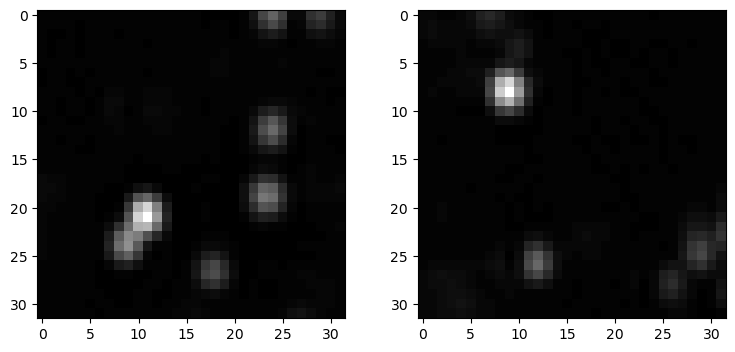

In [13]:
best_dist, best_shift = match_template(a_win, b_win)
print(f'{best_dist=}')
print(f'{best_shift=}')

fig, axs = plt.subplots(1, 2, figsize=(9, 4))
axs[0].imshow(np.roll(a_win, best_shift, axis=(0, 1)), cmap='gray')
axs[1].imshow(b_win, cmap='gray')
plt.show()

### Find shift through cross-correlation

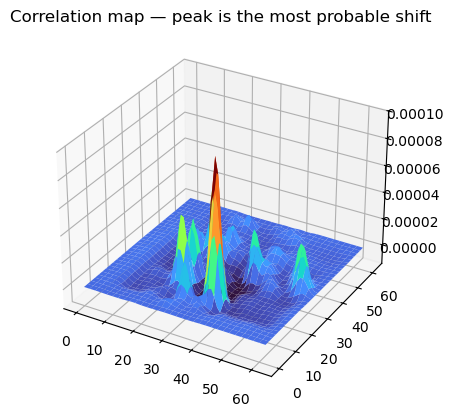

In [14]:
from scipy.signal import correlate
from mpl_toolkits.mplot3d import Axes3D

# Compute cross correlation (using de-meaned values)
cross_corr = correlate(b_win - b_win.mean(), a_win - a_win.mean()).squeeze()

fig = plt.figure()
ax = fig.add_subplot(projection="3d")
Y, X = np.meshgrid(np.arange(cross_corr.shape[0]), np.arange(cross_corr.shape[1]))

ax.plot_surface(Y, X, cross_corr, cmap='turbo', linewidth=0.2)  # type: ignore
plt.title("Correlation map — peak is the most probable shift")
plt.show()

y=np.int64(18), x=np.int64(35)


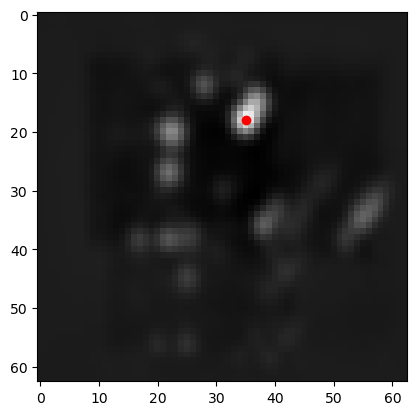

In [15]:
plt.imshow(cross_corr, cmap=plt.cm.gray)

# Obtain (x,y)-index of most probable shift
y, x = np.unravel_index(cross_corr.argmax(), cross_corr.shape)
print(f"{y=}, {x=}")

plt.plot(x, y, "ro")
plt.show()

In [ ]:
dy, dx = y - (win_size - 1), x - (win_size - 1)
print(f'{dy=}, {dx=}')

dy=np.int64(-13), dx=np.int64(4)


Obtain velocity field by repeating this analysis for all possible small windows

In [ ]:
def vel_field(curr_frame, next_frame, win_size):
    ys = np.arange(0, curr_frame.shape[0], win_size)
    xs = np.arange(0, curr_frame.shape[1], win_size)
    dys = np.zeros((len(ys), len(xs)))
    dxs = np.zeros((len(ys), len(xs)))
    for iy, y in enumerate(ys):
        for ix, x in enumerate(xs):
            int_win = curr_frame[y : y + win_size, x : x + win_size]
            search_win = next_frame[y : y + win_size, x : x + win_size]
            cross_corr = correlate(
                search_win - search_win.mean(), int_win - int_win.mean(), method="fft"
            )
            dys[iy, ix], dxs[iy, ix] = (
                np.unravel_index(np.argmax(cross_corr), cross_corr.shape)
                - np.array([win_size, win_size])
                + 1
            )
    # draw velocity vectors from the center of each window
    ys = ys + win_size / 2
    xs = xs + win_size / 2
    return xs, ys, dxs, dys

In [ ]:
frame_a = frame_a.squeeze()
frame_b = frame_b.squeeze()

def plot_velocity_fields(frame_a, frame_b, win_sizes):
    n_frames = len(win_sizes)
    cols = 4
    rows = (n_frames + cols - 1) // cols  # ceiling division

    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(rows, cols)

    for i, size in enumerate(win_sizes):
        r, c = divmod(i, cols)
        xs, ys, dxs, dys = vel_field(frame_a, frame_b, size)
        norm_drs = np.sqrt(dxs ** 2 + dys ** 2)
           
        axes[r, c].quiver(
            xs,
            ys[::-1],
            dxs,
            -dys,
            norm_drs,
            cmap="turbo",
            angles="xy",
            scale_units="xy",
            scale=0.25,
        )
        axes[r, c].set_aspect('equal')
        axes[r, c].set_title(f"Window Size {size}")
        #axes[r, c].axis('off')

    # Hide any unused subplots
    for j in range(i + 1, rows * cols):
        r, c = divmod(j, cols)
        axes[r, c].axis('off')

    plt.tight_layout()
    plt.show()

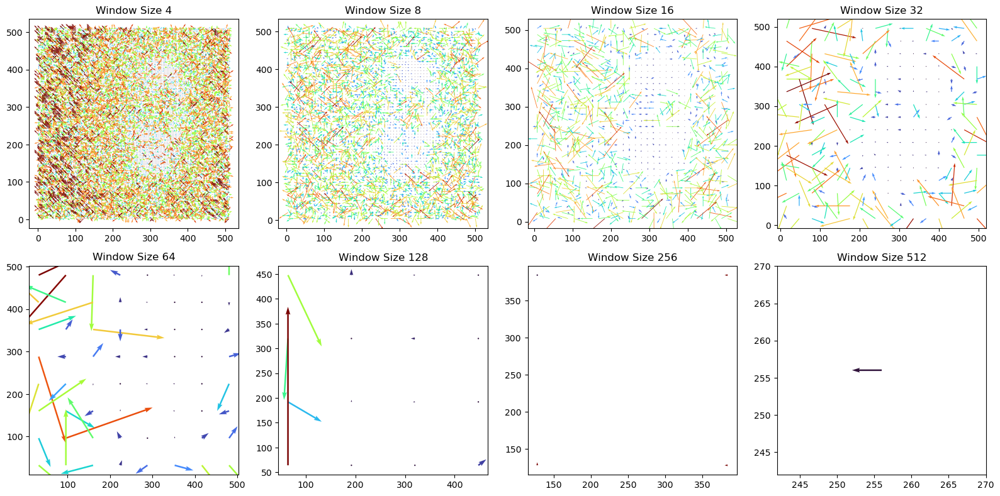

In [19]:
plot_velocity_fields(frame_a, frame_b, [4, 8, 16, 32, 64, 128, 256, 512])